In [24]:
from wavediffusion.model_unet import myUnet
from wavediffusion.model import Scaled
from wavediffusion.wavedata import npyDataResized, npyDataWndHist, npyDataWndHistDaily
from torch.utils.data import DataLoader
from torch_ema import ExponentialMovingAverage as EMA
from wavediffusion.diffusion import ScheduleLogLinear, ScheduleDDPM, samples, samples_thres
from accelerate import Accelerator
import torch
import numpy as np
import os
from torchvision import transforms as tf
from matplotlib import pyplot as plt
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


#### Without history

In [3]:
train_file_path = '/global/homes/j/jiarongw/scratch_folder/wave_data/train_global/'
test_file_path = '/global/homes/j/jiarongw/scratch_folder/wave_data/test_global/'
test_file_names = [('wave_200804', 'forcing_200804')]
stats_file = os.path.join(train_file_path, 'stats.npz')
stats = np.load(stats_file)
meanx, stdx = stats['meanx'], stats['stdx']
meanf, stdf = stats['meanf'], stats['stdf']

### Construct test dataset
test_file_list = [(os.path.join(test_file_path, f'{x}.npy'), 
                   os.path.join(test_file_path, f'{f}.npy')) for x, f in test_file_names]
test = npyDataResized(
    test_file_list,
    resize_x=(320,320), resize_f=(320,320), 
    landmaskname=os.path.join(test_file_path, 'mask.npy'),
    use_icymask=True,
    compute_stats=False,
    meanx=meanx, stdx=stdx, meanf=meanf, stdf=stdf
)

In [4]:
epoch = 16
path = '/global/homes/j/jiarongw/scratch_folder/log1p/DDPM3/'
weights_file = path + f'ckpt_{epoch}.pt'

RESUME = True
GUIDED = True

# model = Scaled(myUnet)(in_dim=320, in_ch=4, out_ch=4, ch=192, precond_ch=3, 
#                        scale=(torch.tensor([0.,0.,0.,0.]), torch.tensor([0.,0.,0.,0.]),
#                               torch.tensor([0.,0.,0.,]), torch.tensor([0.,0.,0.,])),
#                        ch_mult=(1, 2, 2), attn_resolutions=(16,))

model = Scaled(myUnet)(in_dim=320, in_ch=4, out_ch=4, ch=192, precond_ch=3, 
                       scale=(torch.tensor([0.,0.,0.,0.]), torch.tensor([0.,0.,0.,0.]),
                              torch.tensor([0.,0.,0.,]), torch.tensor([0.,0.,0.,])),
                       ch_mult=(1, 2, 2), attn_resolutions=(16,))

#### With history

In [25]:
train_file_path = '/global/homes/j/jiarongw/scratch_folder/wave_data/train_global/'
test_file_path = '/global/homes/j/jiarongw/scratch_folder/wave_data/test_global/'

stats_file = os.path.join(train_file_path, 'stats.npz')
stats = np.load(stats_file)
meanx, stdx = stats['meanx'], stats['stdx']
meanf, stdf = stats['meanf'], stats['stdf']

test_file_path = '/global/homes/j/jiarongw/scratch_folder/wave_data/test_global/'
test_file_names = [('wave_200804', 'forcing_200804')]
test_file_list = [(os.path.join(test_file_path, f'{x}.npy'), 
                   os.path.join(test_file_path, f'{f}.npy')) for x, f in test_file_names]
test = npyDataWndHist(
    test_file_list,
    resize_x=(320,320), resize_f=(320,320), 
    landmaskname=os.path.join(test_file_path, 'mask.npy'),
    use_icymask=True, compute_stats=False,
    meanx=meanx, stdx=stdx, meanf=meanf, stdf=stdf
)

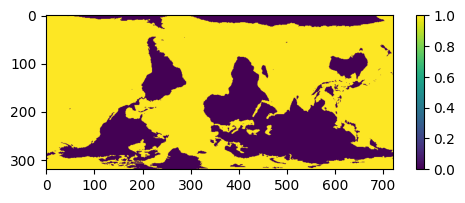

In [9]:
plt.figure(figsize=[6,2])
plt.imshow(test.landmask)
plt.colorbar()

In [10]:
RESUME = True
GUIDED = False
epoch = 20
path = '/global/homes/j/jiarongw/scratch_folder/log1p/hist1/'
weights_file = path + f'ckpt_{epoch}.pt'

model = Scaled(myUnet)(in_dim=320, in_ch=4, out_ch=4, ch=256, precond_ch=13, 
                       scale=(test.meanx, test.stdx, test.meanf, test.stdf),
                       ch_mult=(1, 2, 2), attn_resolutions=(16,))  

In [4]:
model

myUnetScaled(
  (sig_embed): SigmaEmbedderSinCos(
    (mlp): Sequential(
      (0): Linear(in_features=2, out_features=1024, bias=True)
      (1): SiLU()
      (2): Linear(in_features=1024, out_features=1024, bias=True)
    )
  )
  (conv_in): Conv2d(17, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Module(
      (blocks): ModuleList(
        (0-1): 2 x CondSequential(
          (0): ResnetBlock(
            (layer1): Sequential(
              (0): GroupNorm(32, 256, eps=1e-06, affine=True)
              (1): SiLU()
              (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            )
            (temb_proj): Sequential(
              (0): SiLU()
              (1): Linear(in_features=1024, out_features=256, bias=True)
            )
            (layer2): Sequential(
              (0): GroupNorm(32, 256, eps=1e-06, affine=True)
              (1): SiLU()
              (2): Dropout(p=0.1, inplace=False)
              (

#### Load 

In [12]:
ema = EMA(model.parameters(), decay=0.999)
    
if RESUME:
    ckpt = torch.load(weights_file, map_location="cpu")
    model.load_state_dict(ckpt["model"])
    ema.load_state_dict(ckpt["ema"])

loader_test = DataLoader(test, batch_size=1, shuffle=False)
a = Accelerator()
model, loader_test = a.prepare(model, loader_test)
ema.to(a.device)

schedule_infer = ScheduleLogLinear(sigma_min=0.01, sigma_max=80, N=100)
# schedule_infer = ScheduleDDPM(N=700)

In [11]:
pytorch_total_params = sum(p.numel() for p in model.parameters())
print(f"Total Parameters: {pytorch_total_params}")
pytorch_trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total Trainable Parameters: {pytorch_trainable_params}")

Total Parameters: 98054404
Total Trainable Parameters: 98054404


### Generate

In [5]:
# sampling from index sample of test set batched (by stacking f)
@torch.no_grad()
def sample (index, n_ensem=10):
    global test, ema, model, schedule_infer
    x, f, mask = test.__getitem__(index)
    x = x.unsqueeze(0); f = f.unsqueeze(0); mask = mask.unsqueeze(0)
    f = f.repeat(n_ensem, 1, 1, 1)    
    x0_ensem = []
    with ema.average_parameters():
        if GUIDED:
            hs_thres = -test.meanx[0]/test.stdx[0]
            *xt, x0 = samples_thres(model, schedule_infer.sample_sigmas(50), gam=1, mu=0.5, batchsize=n_ensem, 
                                    thres=hs_thres, accelerator=a, cond=f, mask=mask)
        else:
            *xt, x0 = samples(model, schedule_infer.sample_sigmas(50), gam=1, mu=0.5, batchsize=n_ensem,
                              accelerator=a, cond=f, mask=mask)
        # This operation hasn't been broadcasted
        for i in range(0, n_ensem):
            x_ = test.invert_x(x0[i])
            x_ = x_ * tf.Resize((320,720))(mask[0].to(x_))
            x0_ensem.append(x_.cpu().numpy())
    
    x_truth = test.invert_x(x[0]) * tf.Resize((320,720))(mask[0].to(x))
    x_truth = x_truth.cpu().numpy()
    f_ = test.invert_f(f[0]).cpu().numpy()
    x0_ensem = np.array(x0_ensem)
    
    mean = x0_ensem.mean(axis=0)
    std = x0_ensem.std(axis=0)    
    
    return x_truth, mean, std

In [6]:
x_truth, mean, std = sample (10, n_ensem=2)

/global/u1/j/jiarongw/wavediffusion/src/wavediffusion/wavedata.py:373: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /mscratch/sd/s/swowner/pytorch-build/pytorch/2.6.0/pytorch/torch/csrc/utils/tensor_numpy.cpp:203.)
  f = torch.from_numpy(self.F_files[file_idx][local_idx]).float()


In [ ]:
n_ensem = 10

x, f, mask = test.__getitem__(100)
x = x.unsqueeze(0); f = f.unsqueeze(0); mask = mask.unsqueeze(0)
f = f.repeat(n_ensem, 1, 1, 1)

x0_ensem = []
# TODO: make this batched (by stacking f)
with ema.average_parameters():
    if GUIDED:
        hs_thres = -test.meanx[0]/test.stdx[0]
        *xt, x0 = samples_thres(model, schedule_infer.sample_sigmas(50), gam=1, mu=0.5, batchsize=n_ensem, 
                                thres=hs_thres, accelerator=a, cond=f, mask=mask)
    else:
        *xt, x0 = samples(model, schedule_infer.sample_sigmas(50), gam=1, mu=0.5, batchsize=n_ensem,
                          accelerator=a, cond=f, mask=mask)
    # This operation hasn't been broadcasted
    for i in range(0, n_ensem):
        x_ = test.invert_x(x0[i])
        x_ = x_ * tf.Resize((320,720))(mask[0].to(x_))
        x0_ensem.append(x_.cpu().numpy())

x_truth = test.invert_x(x[0]) * tf.Resize((320,720))(mask[0].to(x))
x_truth = x_truth.cpu().numpy()
f_ = test.invert_f(f[0]).cpu().numpy()
x0_ensem = np.array(x0_ensem)

mean = x0_ensem.mean(axis=0)
std = x0_ensem.std(axis=0)

### Plot individual samples

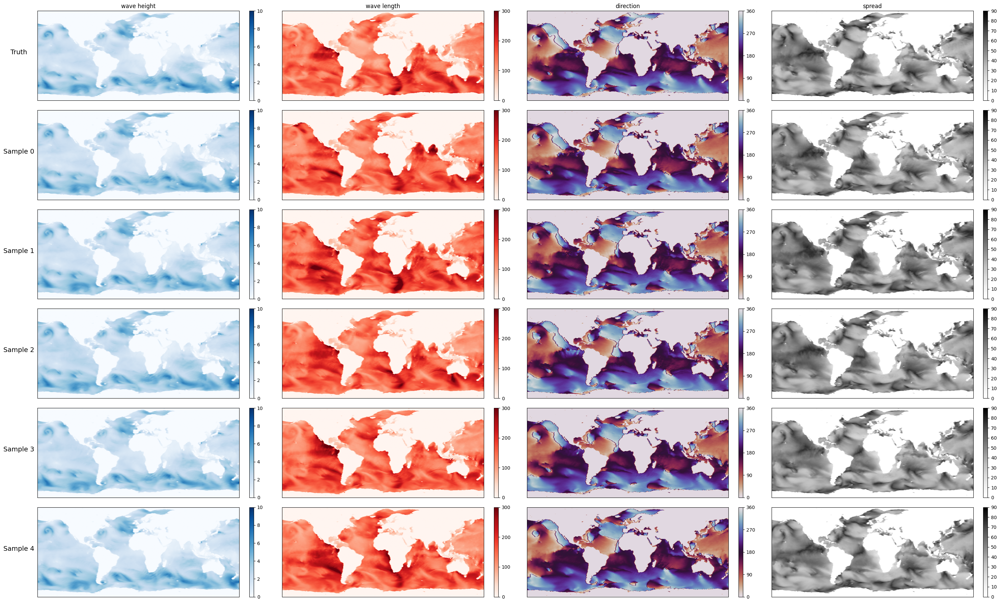

In [62]:
from wavediffusion.waveutils import plot_sample
fig = plot_sample(x_truth[:,::-1], x0_ensem[:5,:,::-1], f_[:,::-1])

/tmp/ipykernel_1269452/916911825.py:4: RuntimeWarning: invalid value encountered in divide
  plt.imshow(c[::-1]/u[::-1], vmax=5, vmin=0.8, cmap='Blues')


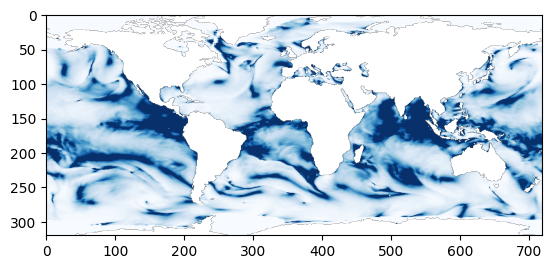

In [112]:
from waveutils import plot_sample
c = (9.8*x_truth[1]/2/np.pi)**0.5
u = (f_[0] ** 2 + f_[1] ** 2)**0.5
plt.imshow(c[::-1]/u[::-1], vmax=5, vmin=0.8, cmap='Blues')

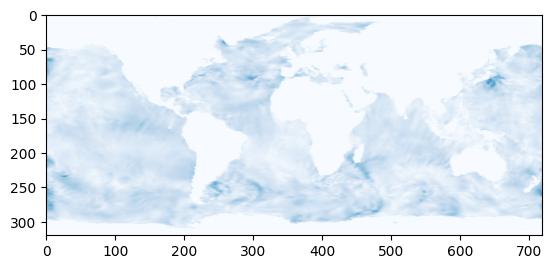

In [10]:
plt.imshow(std[0,::-1], vmax=1, vmin=0, cmap='Blues')

/tmp/ipykernel_662859/396576074.py:9: RuntimeWarning: invalid value encountered in divide
  img3 = axes[2].imshow(abs(mean[field,::-1] - x_truth[field,::-1])/std[field,::-1], vmax=1, vmin=0, cmap='Blues')


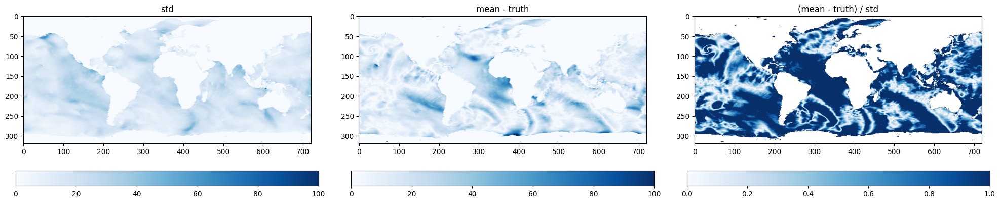

In [63]:
fig, axes = plt.subplots(1, 3, figsize=[20,4])
field = 1
img1 = axes[0].imshow(std[field,::-1], vmax=100, vmin=0, cmap='Blues')
plt.colorbar(img1, orientation='horizontal')
axes[0].set_title('std')
img2 = axes[1].imshow(abs(mean[field,::-1] - x_truth[field,::-1]), vmax=100, vmin=0, cmap='Blues')
plt.colorbar(img2, orientation='horizontal')
axes[1].set_title('mean - truth')
img3 = axes[2].imshow(abs(mean[field,::-1] - x_truth[field,::-1])/std[field,::-1], vmax=1, vmin=0, cmap='Blues')
plt.colorbar(img3, orientation='horizontal')
axes[2].set_title('(mean - truth) / std')
plt.tight_layout()

/tmp/ipykernel_662859/757119340.py:9: RuntimeWarning: invalid value encountered in divide
  img3 = axes[2].imshow(abs(mean[field,::-1] - x_truth[field,::-1])/std[field,::-1], vmax=1, vmin=0, cmap='Blues')


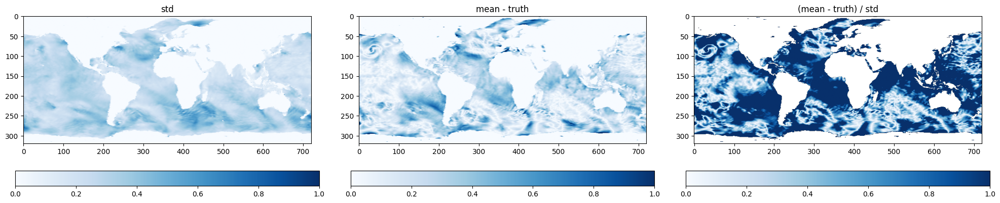

In [64]:
fig, axes = plt.subplots(1, 3, figsize=[20,4])
field = 0
img1 = axes[0].imshow(std[field,::-1], vmax=1, vmin=0, cmap='Blues')
plt.colorbar(img1, orientation='horizontal')
axes[0].set_title('std')
img2 = axes[1].imshow(abs(mean[field,::-1] - x_truth[field,::-1]), vmax=1, vmin=0, cmap='Blues')
plt.colorbar(img2, orientation='horizontal')
axes[1].set_title('mean - truth')
img3 = axes[2].imshow(abs(mean[field,::-1] - x_truth[field,::-1])/std[field,::-1], vmax=1, vmin=0, cmap='Blues')
plt.colorbar(img3, orientation='horizontal')
axes[2].set_title('(mean - truth) / std')
plt.tight_layout()

In [47]:
mask_original = tf.Resize((320,720))(mask[0].to(x)).numpy()[0,::-1]

/tmp/ipykernel_662859/846521164.py:2: RuntimeWarning: invalid value encountered in divide
  err = (mean[field,::-1] - x_truth[field,::-1])/std[field,::-1]


(-4.0, 4.0)

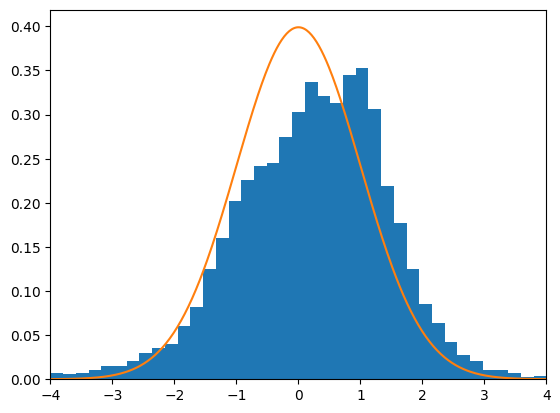

In [65]:
field = 1
err = (mean[field,::-1] - x_truth[field,::-1])/std[field,::-1]
plt.hist(err[mask_original == 1].flatten(), bins=np.linspace(-4,4,40), density=True)

sigma = 1; mu = 0
x = np.linspace(-5, 5, 500)
pdf = 1/(sigma*np.sqrt(2*np.pi)) * np.exp(-(x-mu)**2/(2*sigma**2))
plt.plot(x, pdf)
plt.xlim([-4, 4])

In [ ]:
plt.imshow(std[1,::-1], vmax=100, vmin=0, cmap='Blues')

/tmp/ipykernel_1269452/896684695.py:1: RuntimeWarning: invalid value encountered in divide
  plt.imshow(std[1,::-1]/mean[1,::-1], vmax=0.5, vmin=0, cmap='Blues')


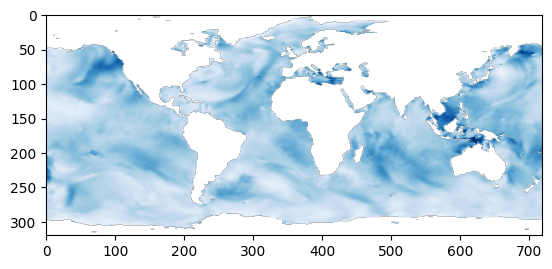

In [129]:
plt.imshow(std[1,::-1]/mean[1,::-1], vmax=0.5, vmin=0, cmap='Blues')

/tmp/ipykernel_1269452/3766158363.py:1: RuntimeWarning: invalid value encountered in divide
  plt.imshow((mean[1,::-1]-x_truth[1,::-1])/x_truth[1,::-1], vmax=0.5, vmin=0, cmap='Blues')


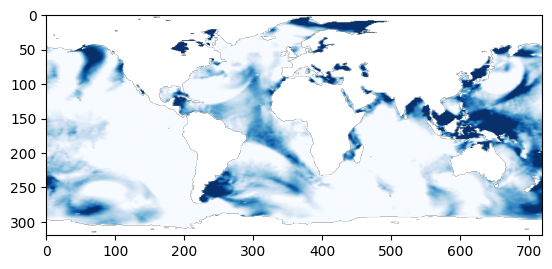

In [132]:
plt.imshow((mean[1,::-1]-x_truth[1,::-1])/x_truth[1,::-1], vmax=0.5, vmin=0, cmap='Blues')

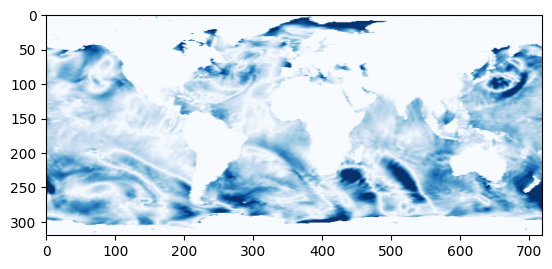

In [140]:
plt.imshow(abs(mean[0,::-1]-x_truth[0,::-1]), vmax=1, vmin=0, cmap='Blues')

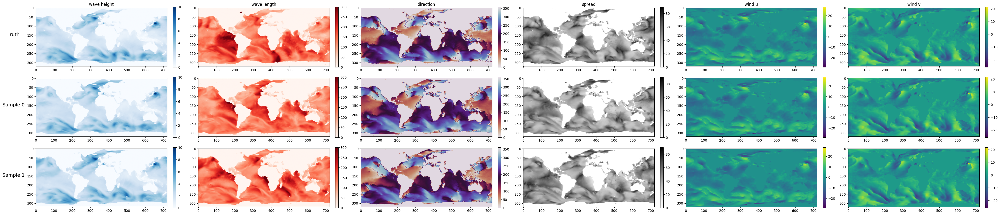

In [62]:
from waveutils import plot_sample
fig = plot_sample(x_truth[:,::-1], x0_ensem[:2,:,::-1], f_[:,::-1])

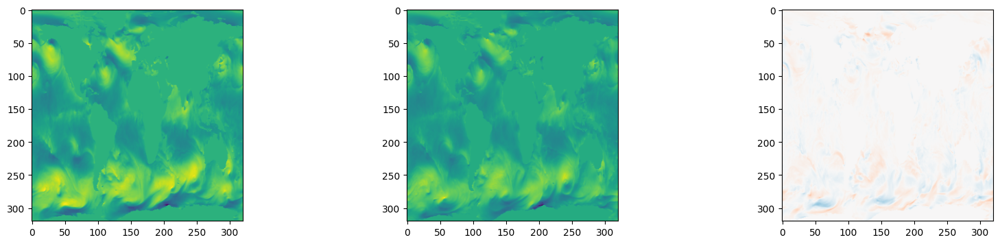

In [23]:
fig, axes = plt.subplots(1, 3, figsize=(20, 4))
axes[0].imshow(f[0,0].cpu().numpy()[::-1])
axes[1].imshow(f[0,3].cpu().numpy()[::-1])
axes[2].imshow(f[0,3].cpu().numpy()[::-1] - f[0,0].cpu().numpy()[::-1], vmax=10, vmin=-10, cmap='RdBu_r')

### Plot mean and variance

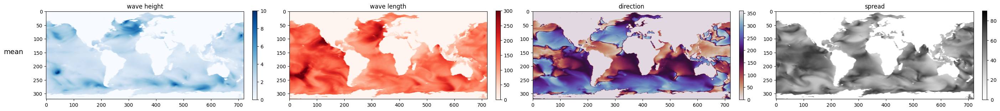

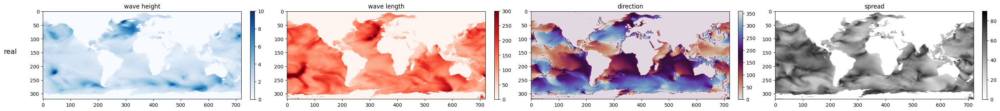

In [8]:
from wavediffusion.waveutils import plot_wave
for index in (0, 200, 4):
    path = '/global/homes/j/jiarongw/wavediffusion/example/temp/sampled/'
    x_truth = np.load(f'{path}truth_{index}.npy')
    mean = np.load(f'{path}mean_{index}.npy')
    fig = plot_wave(mean[:,::-1], label='mean')
    fig = plot_wave(x_truth[:,::-1], label='real')

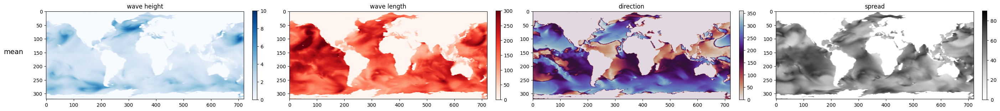

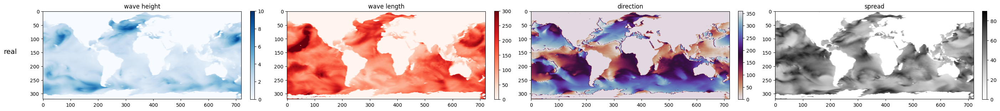

In [27]:
from wavediffusion.waveutils import plot_wave
index = 40
path = '/global/homes/j/jiarongw/wavediffusion/example/temp/1day_pre_2004_DDPM_40steps_150_20ensem/'
x_truth = np.load(f'{path}truth_{index}.npy')
mean = np.load(f'{path}mean_{index}.npy')
fig = plot_wave(mean[:,::-1], label='mean')
fig = plot_wave(x_truth[:,::-1], label='real')

In [21]:
@torch.no_grad()
def sample (f, x, mask, xt=None, n_ensem=10):
    global a, test, ema, model, schedule_infer, GUIDED 
    f = f.repeat(n_ensem, 1, 1, 1)    
    xt = xt.repeat(n_ensem, 1, 1, 1) * mask.to(a.device) if xt is not None else None
    if xt is None:
        print("Start with no history snapshot.")
    x0_ensem = []
    with ema.average_parameters():
        if GUIDED:
            hs_thres = -test.meanx[0]/test.stdx[0]
            *xt, x0 = samples_thres(model, schedule_infer.sample_sigmas(40), gam=1, mu=0.5, batchsize=n_ensem, 
                                    thres=hs_thres, accelerator=a, cond=f, mask=mask, xt=xt)
        else:
            *xt, x0 = samples(model, schedule_infer.sample_sigmas(40), gam=1, mu=0.5, batchsize=n_ensem,
                              accelerator=a, cond=f, mask=mask, xt=xt)
        # This operation hasn't been broadcasted
        for i in range(0, n_ensem):
            x_ = test.invert_x(x0[i])
            x_ = x_ * tf.Resize((320,720))(mask[0].to(x_))
            x0_ensem.append(x_.cpu().numpy())
    
    x_truth = test.invert_x(x[0]) * tf.Resize((320,720))(mask[0].to(x))
    x_truth = x_truth.cpu().numpy()
    f_ = test.invert_f(f[0]).cpu().numpy()
    x0_ensem = np.array(x0_ensem)
    
    mean = x0_ensem.mean(axis=0)
    std = x0_ensem.std(axis=0)    
    
    return x_truth, mean, std

In [22]:
n_ensem = 5
x, f, icymask = test.__getitem__(0)
x = x.unsqueeze(0); f = f.unsqueeze(0); icymask = icymask.unsqueeze(0)
x_truth, mean, std = sample (f, x, icymask, xt=None, n_ensem=n_ensem)

Start with no history snapshot.


In [23]:
mean.shape[0]

(4, 320, 720)

In [ ]:
xt = test.tf_x(torch.tensor(mean).to(a.device)) + schedule_infer.sample_sigmas(40)[0].to(a.device) * torch.randn(model.input_dims).to(a.device)
x_truth, mean, std = sample (f, x, icymask, xt=xt, n_ensem=n_ensem)

In [13]:
a = Accelerator()
model = a.prepare(model)
xt = test.tf_x(torch.tensor(mean).to(a.device)) + schedule_infer.sample_sigmas(40)[0].to(a.device) * torch.randn(model.input_dims).to(a.device)
xt = xt.repeat(, 1, 1, 1) * mask.to(a.device)

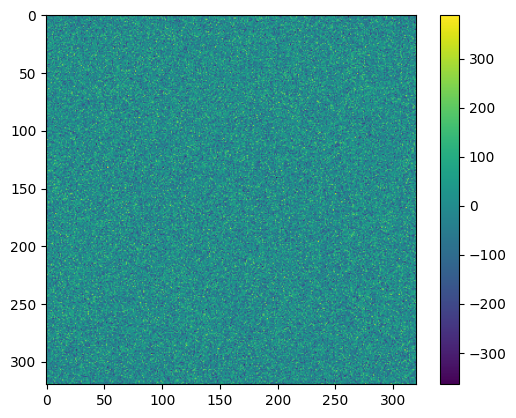

In [16]:
plt.imshow(xt[0].cpu().numpy())
plt.colorbar()

In [ ]:
model.rand_input(batchsize=1).to(a.device) * schedule_infer.sample_sigmas(40)[0] * mask.to(a.device)

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import imageio
from wavediffusion.waveutils import plot_wave

def generate_video(indices, filename, label='truth'):
    with imageio.get_writer(video_file, mode="I", fps=10) as writer:    
        for index in indices:  
            x = np.load(f'{filename}_{index}.npy')
            fig = plot_wave(x[:,::-1], label=label)        
            # convert figure to image array
            fig.canvas.draw()
            frame = np.asarray(fig.canvas.buffer_rgba())
            frame = frame[:, :, :3]   # remove alpha channel
            writer.append_data(frame)   
            plt.close(fig)

path = '/global/homes/j/jiarongw/wavediffusion/example/temp/1day_pre_2004_DDPM_40steps_150_20ensem/'
# video_file = path + "truth_video.gif"
# filename = path + 'truth'
video_file = path + "mean_video.gif"
filename = path + 'mean'
indices = range(0, 328, 8)
generate_video(indices, filename, label='mean')

In [37]:
for i in indices:
    x_truth = np.load(f'{path}truth_{index}.npy')
    mean = np.load(f'{path}mean_{index}.npy')
    std = np.load(f'{path}std_{index}.npy')
    if i == 0:
        norm_err = np.abs(x_truth - mean)/std
    else:
        norm_err += np.abs(x_truth - mean)/std
norm_err = norm_err / len(indices)

/tmp/ipykernel_196980/845915783.py:6: RuntimeWarning: invalid value encountered in divide
  norm_err = np.abs(x_truth - mean)/std
/tmp/ipykernel_196980/845915783.py:8: RuntimeWarning: invalid value encountered in divide
  norm_err += np.abs(x_truth - mean)/std


In [51]:
from tqdm import tqdm
hs_err = []
lp_err = []
tp_err = []
thetap_err = []
for index in tqdm(indices):
    x_truth = np.load(f'{path}truth_{index}.npy')
    mean = np.load(f'{path}mean_{index}.npy')
    hs_err.append(np.average((x_truth[0,::-1] - mean[0,::-1]) ** 2) ** 0.5)
    lp_err.append(np.average((x_truth[1,::-1] - mean[1,::-1]) ** 2) ** 0.5)
    tp_err.append(np.average(((x_truth[1,::-1]/1.56)**0.5 - (mean[1,::-1]/1.56)**0.5) **2) ** 0.5)
    thetap_err.append(np.average((x_truth[2,::-1] - mean[2,::-1]) ** 2) ** 0.5)
hs_err = np.array(hs_err)
lp_err = np.array(lp_err)
tp_err = np.array(tp_err)
thetap_err = np.array(thetap_err)

100%|██████████| 50/50 [00:01<00:00, 26.76it/s]


In [62]:
print(f'hs error: {hs_err.mean():.2f} \\pm {hs_err.std():.2f}')
print(f'tp error: {tp_err.mean():.2f} \\pm {tp_err.std():.2f}')
print(f'tp error: {thetap_err.mean():.2f} \\pm {thetap_err.std():.2f}')

hs error: 0.22 \pm 0.04
tp error: 0.68 \pm 0.08
tp error: 35.60 \pm 5.60


### ACC

In [6]:
path = '/global/u1/j/jiarongw/wavediffusion/example/temp/2004_DDPM_40steps_100_20ensem/'
indices = np.arange(0, 2850, 80)
indices

array([   0,   80,  160,  240,  320,  400,  480,  560,  640,  720,  800,
        880,  960, 1040, 1120, 1200, 1280, 1360, 1440, 1520, 1600, 1680,
       1760, 1840, 1920, 2000, 2080, 2160, 2240, 2320, 2400, 2480, 2560,
       2640, 2720, 2800])

In [8]:
for i in indices:
    x_truth = np.load(f'{path}truth_{i}.npy')
    if i == 0:
        clim = x_truth
    else:
        clim += x_truth
clim = clim / len(indices)

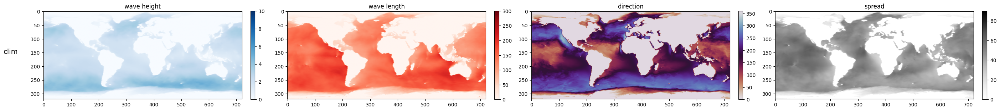

In [11]:
from wavediffusion.waveutils import plot_wave
fig = plot_wave(clim[:,::-1], label='clim')

In [ ]:
mask = test.landmask == 1
wlat = np.load('/global/homes/j/jiarongw/scratch_folder/wave_data/wlat.npy')
# weighted and masked RMSE
def weighted_mse(a, b, mask, w):
    diff2 = (a - b) ** 2
    return np.sum(diff2[mask] * w[mask]) / np.sum(w[mask])
# weighted and masked spread / skill
def weighted_meanvar(std, mask, w):
    var = std ** 2
    return np.sum(var[mask] * w[mask]) / np.sum(w[mask])    

In [29]:
accs_tp = []
for i in indices:
    mean = np.load(f'{path}mean_{i}.npy')
    x_truth = np.load(f'{path}truth_{i}.npy')
    cov = ((mean[1]/1.56)**0.5 - (clim[1]/1.56)**0.5) * ((x_truth[1]/1.56)**0.5 - (clim[1]/1.56)**0.5) 
    var1 = ((mean[1]/1.56)**0.5 - (clim[1]/1.56)**0.5) **2
    var2 = ((x_truth[1]/1.56)**0.5 - (clim[1]/1.56)**0.5)**2
    # covs.append(cov)
    # var1s.append(var1)
    # var2s.append(var2)
    acc_tp = np.sum(cov[mask] * w[mask]) / (np.sum(var1[mask] * w[mask]) * np.sum(var2[mask] * w[mask]))**0.5
    accs_tp.append(acc_tp)

In [30]:
accs_tp = np.array(accs_tp)
print(f'hs acc: {accs_tp.mean():.2f} \\pm {accs_tp.std():.2f}')

hs acc: 0.86 \pm 0.04


In [ ]:

accs_tp = []
for i in indices:
    mean = np.load(f'{path}mean_{i}.npy')
    x_truth = np.load(f'{path}truth_{i}.npy')
    cov = (mean - clim) * (x_truth - clim) 
    var1 = (mean - clim) **2
    var2 = (x_truth - clim)**2
    # covs.append(cov)
    # var1s.append(var1)
    # var2s.append(var2)
    acc_hs = np.sum(cov[0][mask] * w[mask]) / (np.sum(var1[0][mask] * w[mask]) * np.sum(var2[0][mask] * w[mask]))**0.5
    acc_lp = np.sum(cov[1][mask] * w[mask]) / (np.sum(var1[1][mask] * w[mask]) * np.sum(var2[1][mask] * w[mask]))**0.5
    acc_thetap = np.sum(cov[2][mask] * w[mask]) / (np.sum(var1[2][mask] * w[mask]) * np.sum(var2[2][mask] * w[mask]))**0.5
    accs_hs.append(acc_hs)
    accs_lp.append(acc_lp)
    accs_thetap.append(acc_thetap)

In [23]:
mask = test.landmask == 1
w = np.load('/global/homes/j/jiarongw/scratch_folder/wave_data/wlat.npy')

In [27]:
accs_hs = np.array(accs_hs)
accs_lp = np.array(accs_lp)
accs_thetap = np.array(accs_thetap)
print(f'hs acc: {accs_hs.mean():.2f} \\pm {accs_hs.std():.2f}')
print(f'lp acc: {accs_lp.mean():.2f} \\pm {accs_lp.std():.2f}')
print(f'thetap acc: {accs_thetap.mean():.2f} \\pm {accs_thetap.std():.2f}')

hs acc: 0.96 \pm 0.01
lp acc: 0.78 \pm 0.06
thetap acc: 0.88 \pm 0.04


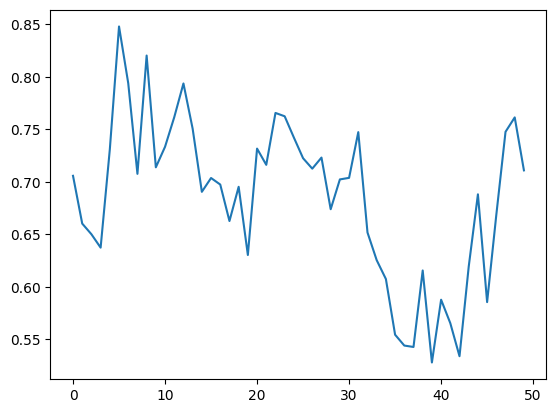

In [50]:
plt.plot(tp_err)

In [70]:
hs_err = np.average((x_truth[0,::-1] - mean[0,::-1]) ** 2) ** 0.5
print(f'hs error: {hs_err:.2f}')
lp_err = np.average((x_truth[1,::-1] - mean[1,::-1]) ** 2) ** 0.5
tp_err = np.average(((x_truth[1,::-1]/1.56)**0.5 - (mean[1,::-1]/1.56)**0.5) **2) ** 0.5
print(f'lp error: {lp_err:.2f}, tp error: {tp_err:.2f}')
thetap_err = np.average((x_truth[2,::-1] - mean[2,::-1]) ** 2) ** 0.5
print(f'thetap error: {thetap_err:.2f}')

hs error: 0.23
lp error: 16.89, tp error: 0.57
thetap error: 23.66


##### More accurate computation with mask (but need changing mask)

tensor(0.6276)


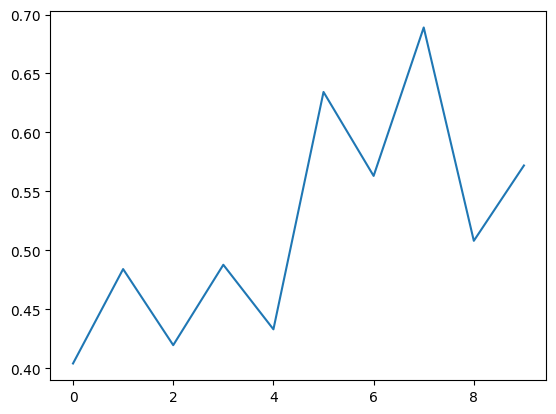

In [93]:
f = 0
rmse = np.zeros(10)
for i in range(0,10):
    rmse[i] = (np.sum((x0_ensem[i,f] - mean[f])**2) / torch.sum(mask))**0.5
plt.plot(rmse)
print((np.sum((x_truth[f] - mean[f])**2) / torch.sum(mask))**0.5)

tensor(1.1636)


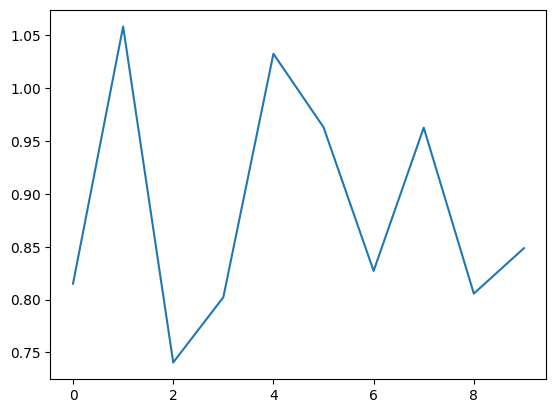

In [94]:
f = 1
a0 = (1*np.pi/9.8) ** 0.5
rmse = np.zeros(10)
for i in range(0,10):
    rmse[i] = (np.sum((a0*(abs(x0_ensem[i,f]))**0.5 - a0*(abs(mean[f]))**0.5)**2) / torch.sum(mask))**0.5
plt.plot(rmse)
print((np.sum((a0*(abs(x_truth[f]))**0.5 - a0*(abs(mean[f]))**0.5)**2) / torch.sum(mask))**0.5)

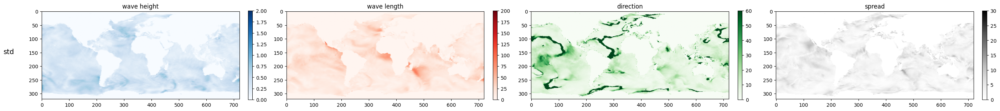

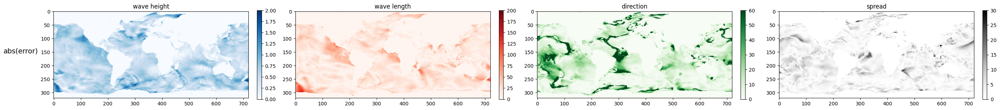

In [13]:
from matplotlib import pyplot as plt
def plot_var(x, label='None'):
    n_sample = x.shape[0]
    fig, axes = plt.subplots(1, 4, figsize=[30, 3], dpi=100)
    titles = ['wave height','wave length','direction','spread']
    imgs = [
        axes[0].imshow(x[0], vmin=0, vmax=2, cmap='Blues'),
        axes[1].imshow(x[1], vmin=0, vmax=200, cmap='Reds'),
        axes[2].imshow(x[2], vmin=0, vmax=60, cmap='Greens'),
        axes[3].imshow(x[3], vmin=0, vmax=30, cmap='Grays'),
    ]
    axes[0].set_ylabel(label, fontsize=14, rotation=0, labelpad=40)
    for j in range(4):
        axes[j].set_title(titles[j])
        fig.colorbar(imgs[j], ax=axes[j], fraction=0.046, pad=0.04)
        
    plt.tight_layout(rect=[0.06, 0, 1, 1])  # leave room on the left for text
    return fig


fig1 = plot_var(std[:,::-1], label='std')
fig2 = plot_var(abs(x_truth[:,::-1] - mean[:,::-1]), label='abs(error)')

### Plot distribution

(5, 320, 720)
(5, 320, 720)
(5, 320, 720)
(5, 320, 720)
(320, 720)
(320, 720)
(320, 720)
(320, 720)


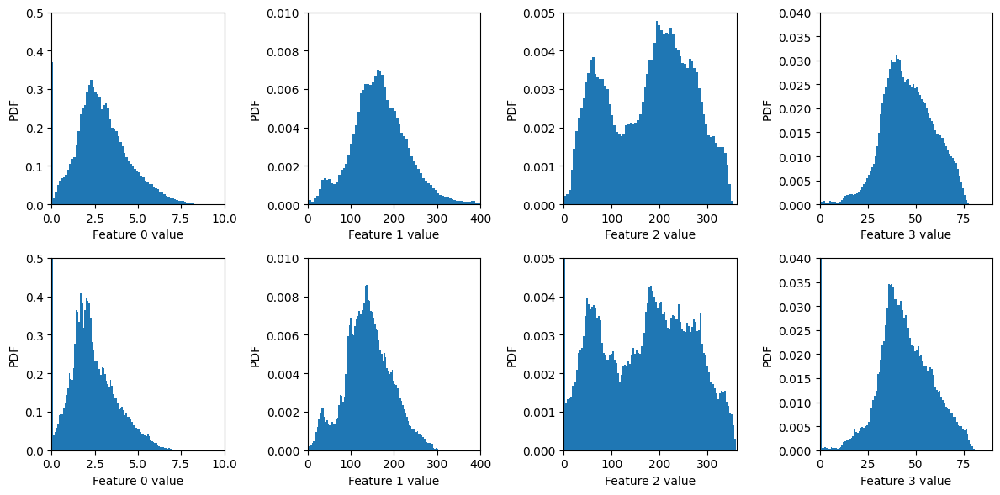

In [8]:
mask_bool = tf.Resize((320,720))(mask[0].to(x)).bool()[0]  # (H, W)

from matplotlib import pyplot as plt

fig, axes = plt.subplots(2, 4, figsize=[12,6], dpi=100)
for i in range(0,4):
    feat_vals = x0_ensem[:, i]         # (B, H, W)
    print(feat_vals.shape)
    selected = feat_vals[:, mask_bool] # (B, Nmasked)
    selected = selected.reshape(-1)    # (B * Nmasked,)
    axes[0,i].hist(selected, bins=100, density=True)
    axes[0,i].set_xlabel(f"Feature {i} value")
    axes[0,i].set_ylabel("PDF")
    # axes[0,i].set_xlim([-3,3])

for i in range(0,4):
    feat_vals = x_truth[i]            # (H, W)
    print(feat_vals.shape)
    selected = feat_vals[mask_bool]
    axes[1,i].hist(selected, bins=100, density=True)
    axes[1,i].set_xlabel(f"Feature {i} value")
    axes[1,i].set_ylabel("PDF")
    # axes[1,i].set_xlim([-3,3])

axes[0,0].set_xlim([0,10]); axes[1,0].set_xlim([0,10])
axes[0,0].set_ylim([0,0.5]); axes[1,0].set_ylim([0,0.5])
axes[0,1].set_xlim([0,400]); axes[1,1].set_xlim([0,400])
axes[0,1].set_ylim([0,0.01]); axes[1,1].set_ylim([0,0.01])
axes[0,2].set_xlim([0,360]); axes[1,2].set_xlim([0,360])
axes[0,2].set_ylim([0,0.005]); axes[1,2].set_ylim([0,0.005])
axes[0,3].set_xlim([0,90]); axes[1,3].set_xlim([0,90])
axes[0,3].set_ylim([0,0.04]); axes[1,3].set_ylim([0,0.04])
plt.tight_layout()

In [ ]:
# If i compare the distribution of any generated field with the truth, it's ok.
# If i compare ensemble, distribution looks smoothed.
# But it seems that there are some extreme values for wave height
# print(x0_ensem[:,0].max()) gives about 340